In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt #plotting
import seaborn as sns #good visualizing
import os
import warnings

warnings.filterwarnings('ignore')
data = pd.read_csv('Wines.csv')
data.columns = data.columns.str.replace(' ','_')
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1143 entries, 0 to 1142
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         1143 non-null   float64
 1   volatile_acidity      1143 non-null   float64
 2   citric_acid           1143 non-null   float64
 3   residual_sugar        1143 non-null   float64
 4   chlorides             1143 non-null   float64
 5   free_sulfur_dioxide   1143 non-null   float64
 6   total_sulfur_dioxide  1143 non-null   float64
 7   density               1143 non-null   float64
 8   pH                    1143 non-null   float64
 9   sulphates             1143 non-null   float64
 10  alcohol               1143 non-null   float64
 11  quality               1143 non-null   int64  
 12  Id                    1143 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 116.2 KB


In [2]:
data.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,Id
count,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000
mean,8.311111,0.531339,0.268364,2.532152,0.086933,15.615486,45.914698,0.996730,3.311015,0.657708,10.442111,5.657043,804.969379
std,1.747595,0.179633,0.196686,1.355917,0.047267,10.250486,32.782130,0.001925,0.156664,0.170399,1.082196,0.805824,463.997116
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000,0.000000
25%,7.100000,0.392500,0.090000,1.900000,0.070000,7.000000,21.000000,0.995570,3.205000,0.550000,9.500000,5.000000,411.000000
50%,7.900000,0.520000,0.250000,2.200000,0.079000,13.000000,37.000000,0.996680,3.310000,0.620000,10.200000,6.000000,794.000000
75%,9.100000,0.640000,0.420000,2.600000,0.090000,21.000000,61.000000,0.997845,3.400000,0.730000,11.100000,6.000000,1209.500000
max,15.900000,1.580000,1.000000,15.500000,0.611000,68.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000,1597.000000


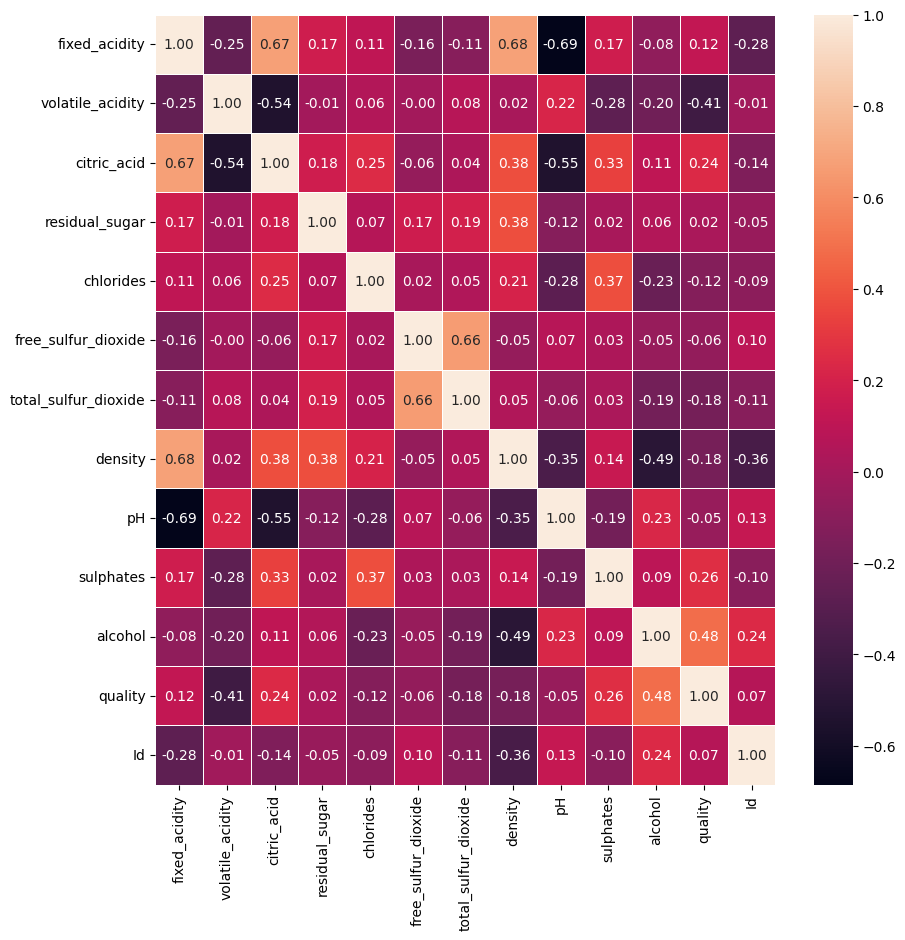

In [3]:
#correlation map view
data.corr() 
f, ax = plt.subplots(figsize = (10,10))
sns.heatmap(data.corr(), annot = True, linewidths=.5, fmt = ".2f", ax=ax)
plt.show()

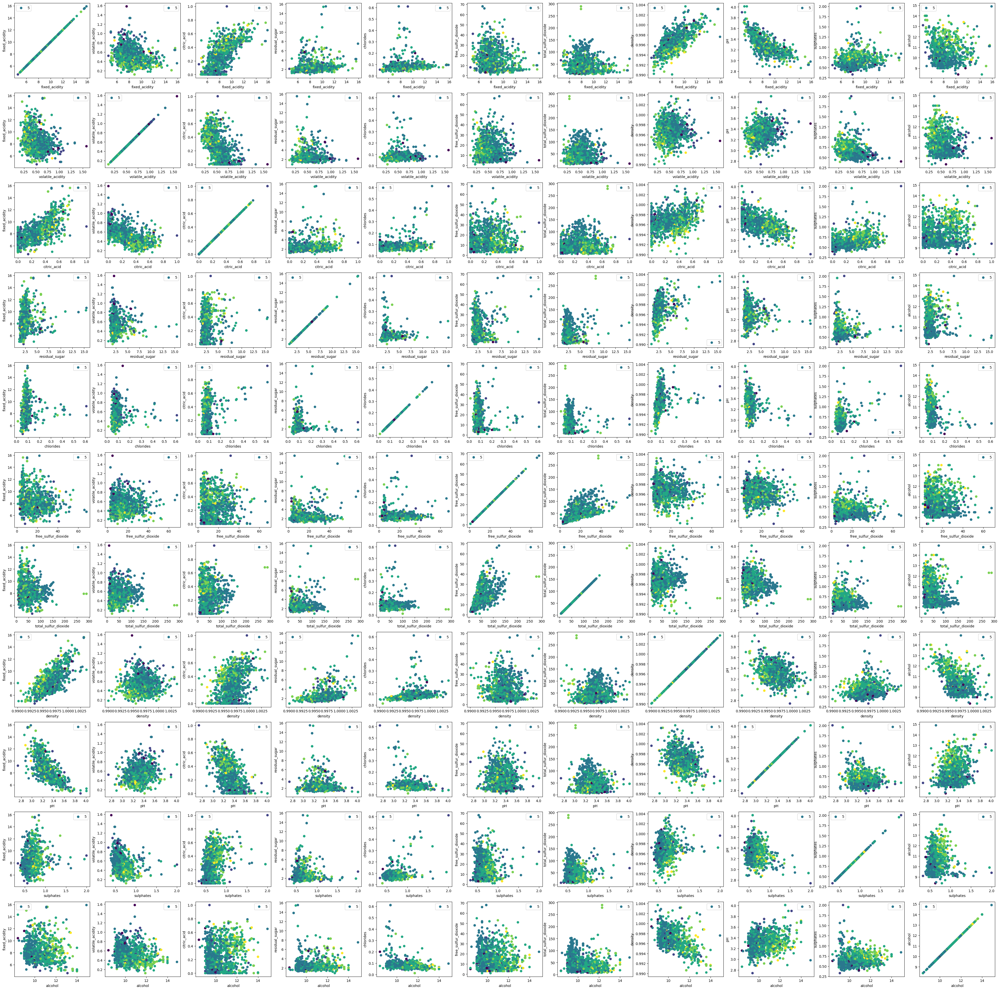

In [4]:
fig, axes = plt.subplots(11,11, figsize=(50,50))
for i in range(11):
    for j in range(11):
        axes[i, j].scatter(data.iloc[:,i], data.iloc[:,j], c = data.quality)
        axes[i,j].set_xlabel(data.columns[i])
        axes[i,j].set_ylabel(data.columns[j])
        axes[i,j].legend(data.quality)
plt.show()

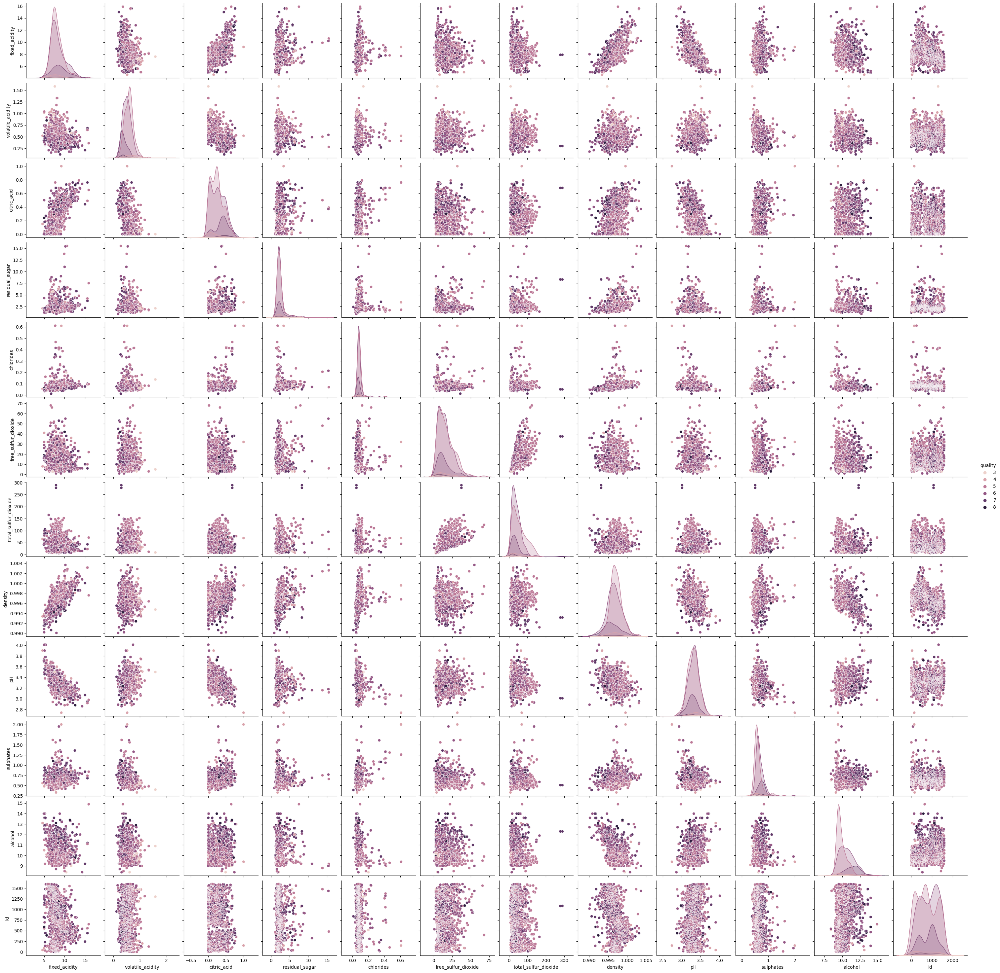

In [5]:
g = sns.pairplot(data, hue="quality")

In [12]:
#How many wine quality number is realted with how many unique wines
#print(data['quality'].value_counts())
sns.barplot(data['quality'].unique(),data['quality'].value_counts())
plt.xlabel("Quality Rankings")
plt.ylabel("Number of Red Wine")
plt.title("Distribution of Red Wine Quality Ratings")
plt.show()

TypeError: barplot() takes from 0 to 1 positional arguments but 2 were given

TypeError: boxplot() got multiple values for argument 'data'

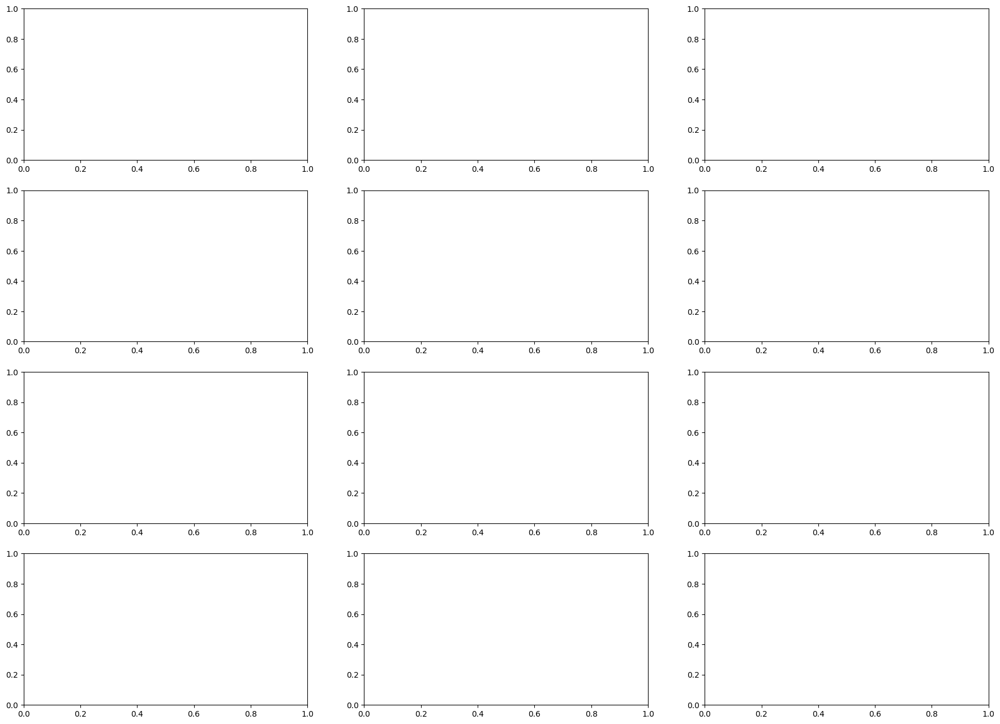

In [13]:
#Check the outliers for each feature with respect to output value
fig, ax1 = plt.subplots(4,3, figsize=(22,16))
k = 0
for i in range(4):
    for j in range(3):
        if k != 11:
            sns.boxplot('quality',data.iloc[:,k], data=data, ax = ax1[i][j])
            k += 1
plt.show()

TypeError: barplot() got multiple values for argument 'data'

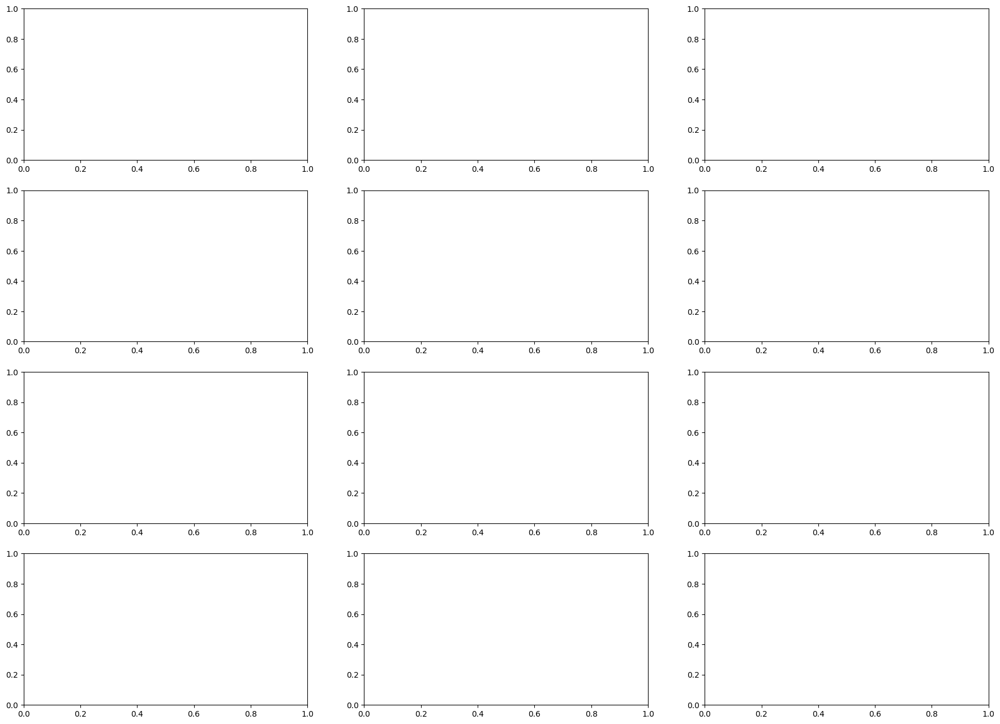

In [14]:
#Check the outliers for each feature with respect to output value
fig, ax1 = plt.subplots(4,3, figsize=(22,16))
k = 0
for i in range(4):
    for j in range(3):
        if k != 11:
            sns.barplot('quality',data.iloc[:,k], data=data, ax = ax1[i][j])
            k += 1
plt.show()

In [17]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit
import graphviz  
#from sklearn.externals.six import StringIO
from IPython.display import Image 

#Normalization ==> x_norm = (x - mean)/std 
#it gives for each value the same value intervals means between 0-1
def normalization(X):
    mean = np.mean(X)
    std = np.std(X)
    X_t = (X - mean)/std
    return X_t

#Train and Test splitting of data     
def train_test(X_t, y):
    x_train, x_test, y_train, y_test = train_test_split(X_t, y, test_size = 0.3, random_state = 42)
    print("Train:",len(x_train), " - Test:", len(x_test))
    return x_train, x_test, y_train, y_test

def grid_search(name_clf, clf, x_train, x_test, y_train, y_test):
    if name_clf == 'Logistic_Regression':
        # Logistic Regression 
        log_reg_params = {"penalty": ['l1', 'l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]}
        grid_log_reg = GridSearchCV(LogisticRegression(), log_reg_params)
        grid_log_reg.fit(x_train, y_train)
        # We automatically get the logistic regression with the best parameters.
        log_reg = grid_log_reg.best_estimator_
        print("Best Parameters for Logistic Regression: ", grid_log_reg.best_estimator_)
        print("Best Score for Logistic Regression: ", grid_log_reg.best_score_)
        print("------------------------------------------")
        return log_reg
    
    elif name_clf == 'SVM':
        # Support Vector Classifier
        svc_params = {'C':[0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0],
                      'kernel': ['rbf', 'poly', 'sigmoid', 'linear']}
        grid_svc = GridSearchCV(SVC(), svc_params)
        grid_svc.fit(x_train, y_train)
        # SVC best estimator
        svc = grid_svc.best_estimator_
        print("Best Parameters for SVM: ", grid_svc.best_estimator_)
        print("Best Score for SVM: ", grid_svc.best_score_)
        print("------------------------------------------")
        return svc
    
    elif name_clf == 'Decision_Tree':
        # DecisionTree Classifier
        tree_params = {"criterion": ["gini", "entropy"], "max_depth": list(range(2,30,1)), 
                  "min_samples_leaf": list(range(5,20,1))}
        grid_tree = GridSearchCV(DecisionTreeClassifier(), tree_params)
        grid_tree.fit(x_train, y_train)
        # tree best estimator
        tree_clf = grid_tree.best_estimator_
        print("Best Parameters for Decision Tree: ", grid_tree.best_estimator_)
        print("Best Score for Decision Tree: ", grid_tree.best_score_)
        print("------------------------------------------")
        
        #FEATURE IMPORTANCE FOR DECISION TREE
        importnce = tree_clf.feature_importances_
        plt.figure(figsize=(10,10))
        plt.title("Feature Importances of Decision Tree")
        plt.barh(X_t.columns, importnce, align="center")
        
        return tree_clf
    
    elif name_clf == 'Random_Forest':
        forest_params = {"bootstrap":[True, False], "max_depth": list(range(2,10,1)), 
                  "min_samples_leaf": list(range(5,20,1))}
        grid_forest = GridSearchCV(RandomForestClassifier(), forest_params)
        grid_forest.fit(x_train, y_train)
        # forest best estimator
        forest_clf = grid_forest.best_estimator_
        print("Best Parameters for Random Forest: ", grid_forest.best_estimator_)
        print("Best Score for Random Forest: ", grid_forest.best_score_)
        print("------------------------------------------")
        
        #FEATURE IMPORTANCE FOR DECISION TREE
        importnce = forest_clf.feature_importances_
        plt.figure(figsize=(10,10))
        plt.title("Feature Importances of Random Forest")
        plt.barh(X_t.columns, importnce, align="center")
        
        return forest_clf
    
def plot_learning_curve(estimator,title, X, y, ylim=None, cv=None, n_jobs=None,
                        train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=cv, 
                                                            n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

#Create applying classification funciton
def apply_classification(name_clf, clf, x_train, x_test, y_train, y_test):
    #Find the best parameters and get the classification with the best parameters as return valu of grid search
    grid_clf = grid_search(name_clf, clf, x_train, x_test, y_train, y_test)
    
    #Plotting the learning curve
    # score curves, each time with 30% data randomly selected as a validation set.
    cv = ShuffleSplit(n_splits=10, test_size=0.3, random_state=42)
    plot_learning_curve(grid_clf, name_clf, x_train, y_train, 
                    ylim=(0.1, 1.01), cv=cv, n_jobs=4)
    
    #Apply cross validation to estimate the skills of models with 10 split with using best parameters
    scores = cross_val_score(grid_clf, x_train, y_train, cv=10)
    print("Mean Accuracy of Cross Validation: %", round(scores.mean()*100,2))
    print("Std of Accuracy of Cross Validation: %", round(scores.std()*100))
    print("------------------------------------------")
    
    #Predict the test data as selected classifier
    clf_prediction = grid_clf.predict(x_test)
    clf1_accuracy = sum(y_test == clf_prediction)/len(y_test)
    print("Accuracy of",name_clf,":",clf1_accuracy*100)
    
    #print confusion matrix and accuracy score before best parameters
    clf1_conf_matrix = confusion_matrix(y_test, clf_prediction)
    print("Confusion matrix of",name_clf,":\n", clf1_conf_matrix)
    print("==========================================")
    return grid_clf

In [18]:
#Now seperate the dataset as response variable and feature variabes
X = data.drop(['quality'], axis = 1)
#y = pd.DataFrame(data['value'])
y = data['quality']

In [19]:
#Normalization
X_t = normalization(X)
print("X_t:", X_t.shape)

#Train and Test splitting of data 
x_train, x_test, y_train, y_test = train_test(X_t, y)

X_t: (1143, 12)
Train: 800  - Test: 343


Best Parameters for Logistic Regression:  LogisticRegression(C=1)
Best Score for Logistic Regression:  0.58625
------------------------------------------
Mean Accuracy of Cross Validation: % 60.12
Std of Accuracy of Cross Validation: % 5
------------------------------------------
Accuracy of Logistic_Regression : 62.68221574344023
Confusion matrix of Logistic_Regression :
 [[  0   6   3   0   0]
 [  1 106  34   2   0]
 [  0  46  92   8   0]
 [  0   3  21  17   0]
 [  0   0   2   2   0]]


LogisticRegression(C=1)

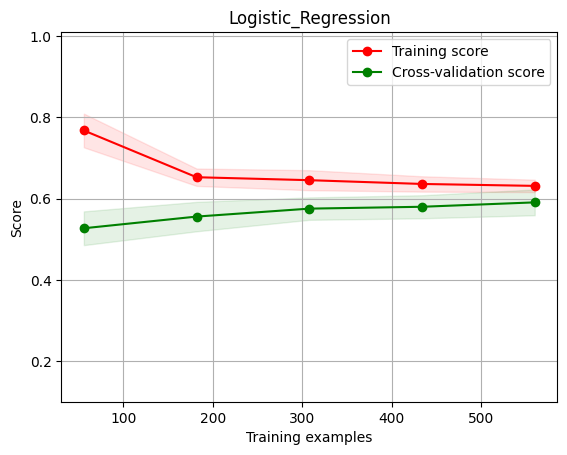

In [20]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
apply_classification('Logistic_Regression', lr, x_train, x_test, y_train, y_test)

In [21]:
from sklearn.svm import SVC

svm = SVC()
apply_classification('SVM', svm, x_train, x_test, y_train, y_test)

KeyboardInterrupt: 

Best Parameters for Decision Tree:  DecisionTreeClassifier(criterion='entropy', max_depth=4, min_samples_leaf=17)
Best Score for Decision Tree:  0.585
------------------------------------------
Mean Accuracy of Cross Validation: % 55.25
Std of Accuracy of Cross Validation: % 5
------------------------------------------
Accuracy of Decision_Tree : 51.89504373177842
Confusion matrix of Decision_Tree :
 [[  0   7   2   0   0]
 [  2 116  24   1   0]
 [  2  82  52  10   0]
 [  1   4  26  10   0]
 [  0   0   2   2   0]]


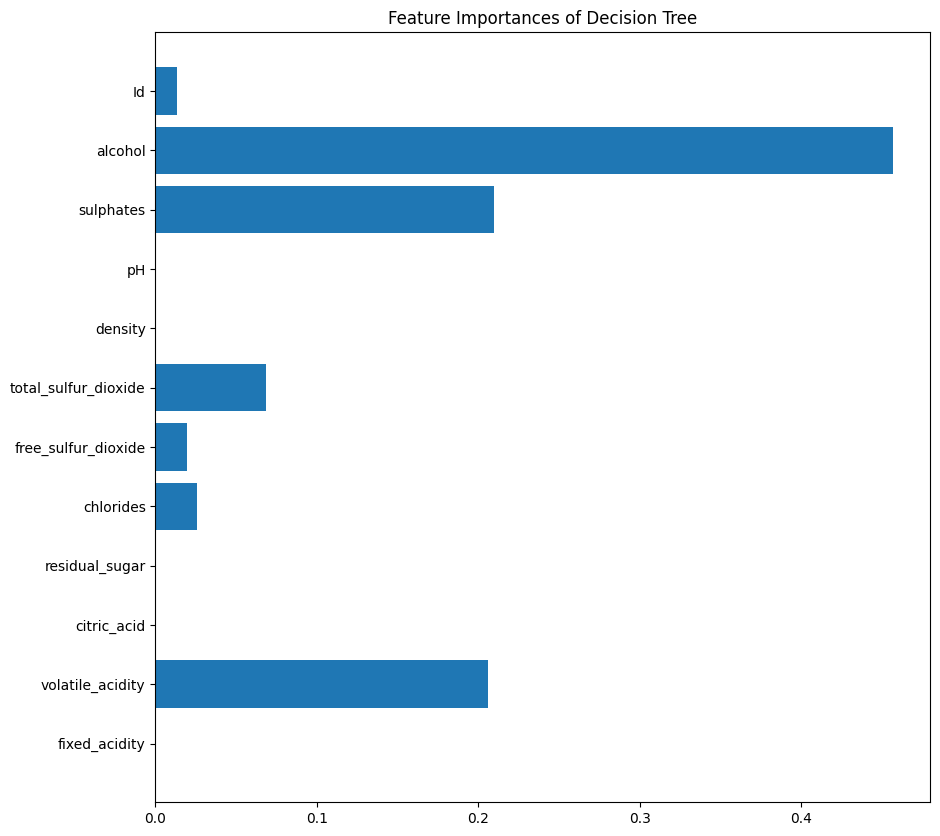

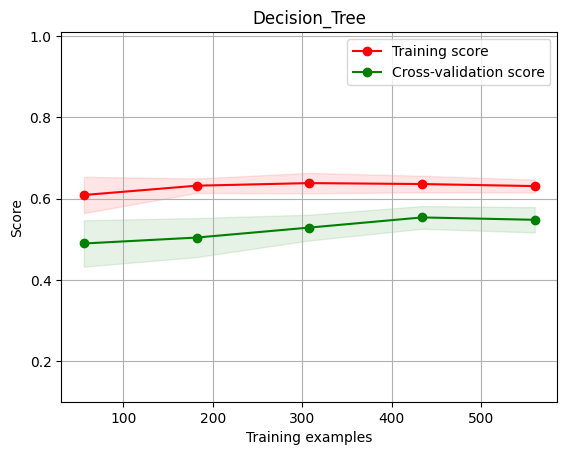

In [22]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn import tree

dt = DecisionTreeClassifier()
dt_clf = apply_classification('Decision_Tree', dt, x_train, x_test, y_train, y_test)

Best Parameters for Random Forest:  RandomForestClassifier(bootstrap=False, max_depth=9, min_samples_leaf=5)
Best Score for Random Forest:  0.6387499999999999
------------------------------------------
Mean Accuracy of Cross Validation: % 62.75
Std of Accuracy of Cross Validation: % 4
------------------------------------------
Accuracy of Random_Forest : 65.01457725947522
Confusion matrix of Random_Forest :
 [[  0   6   3   0   0]
 [  0 105  35   3   0]
 [  0  41 100   5   0]
 [  0   1  22  18   0]
 [  0   0   4   0   0]]


RandomForestClassifier(bootstrap=False, max_depth=9, min_samples_leaf=5)

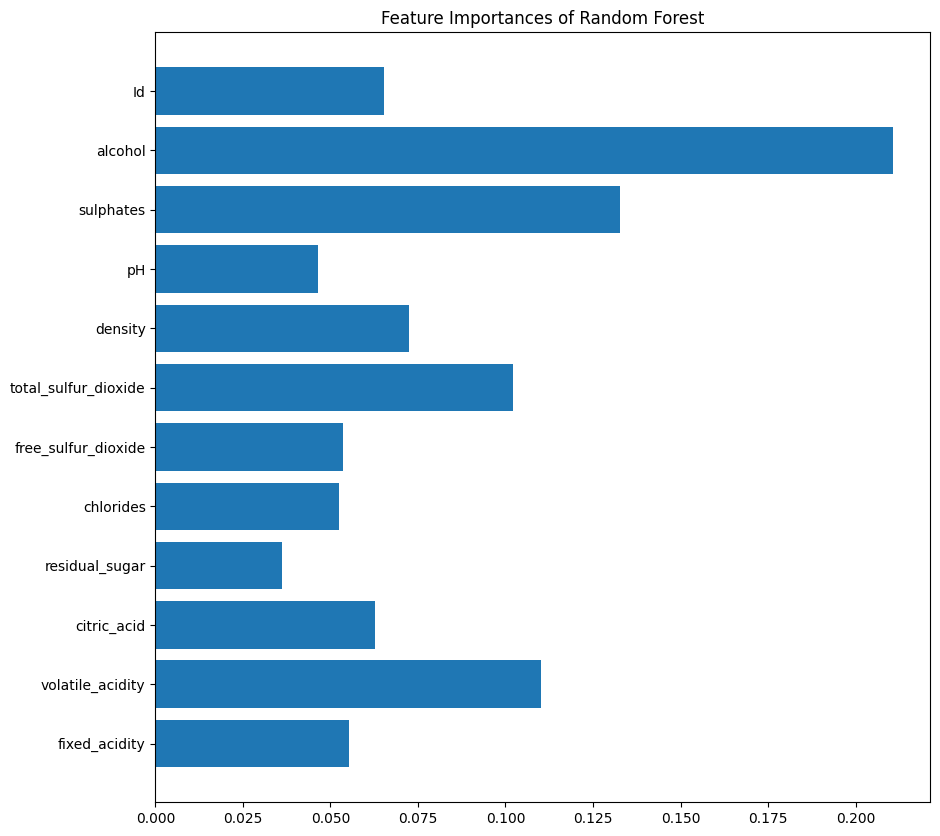

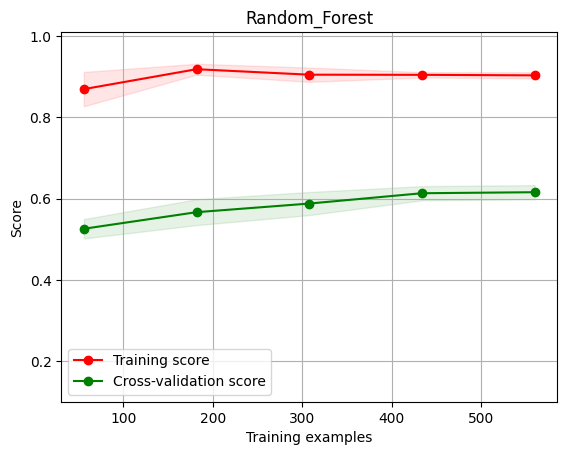

In [23]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100)
apply_classification('Random_Forest', rf, x_train, x_test, y_train, y_test)